In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
lending = pd.read_csv('lending_club_loan_two.csv')


In [3]:
lending.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,16,0,36369,41.8,25,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,17,0,20131,53.3,27,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,13,0,11987,92.2,26,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,6,0,5472,21.5,13,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,13,0,24584,69.8,43,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


In [7]:
lending.shape

(396030, 27)

In [8]:
lending.dtypes

loan_amnt                 int64
term                     object
int_rate                float64
installment             float64
grade                    object
sub_grade                object
emp_title                object
emp_length               object
home_ownership           object
annual_inc              float64
verification_status      object
issue_d                  object
loan_status              object
purpose                  object
title                    object
dti                     float64
earliest_cr_line         object
open_acc                  int64
pub_rec                   int64
revol_bal                 int64
revol_util              float64
total_acc                 int64
initial_list_status      object
application_type         object
mort_acc                float64
pub_rec_bankruptcies    float64
address                  object
dtype: object

In [4]:
lending.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1756
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                37795
pub_rec_bankruptcies      535
address                     0
dtype: int64

# Fixing missing values

In [40]:
#df["emp_title"].value_counts()
lending["emp_title"].value_counts()

emp_title
Teacher                    4389
Manager                    4250
Registered Nurse           1856
RN                         1846
Supervisor                 1830
                           ... 
Postman                       1
McCarthy & Holthus, LLC       1
jp flooring                   1
Histology Technologist        1
Gracon Services, Inc          1
Name: count, Length: 173105, dtype: int64

I've defined the function below to be used to fill in the null values with random samples from the same series, rather than using the mode value. This will mean the values in each data series will have roughly the same weighting, rather than skewing more to the mode values

In [6]:
def replace_nan_with_random(series):
    """Replace NaN values in a Pandas Series with random samples from the non-NaN values."""
    # Remove null values
    non_na_series = series.dropna()

    # If the series is empty after removing nulls, return the original series
    if non_na_series.empty:
        return series

    # Use .apply() to replace NaN values with random samples
    return series.apply(lambda x: non_na_series.sample(1).iloc[0] if pd.isna(x) else x)

In [8]:
#Dropping unneeded columns
lending.drop('emp_title', axis=1, inplace=True)
lending.drop('address', axis=1, inplace=True)

In [9]:
#df["emp_length"].value_counts()
lending["emp_length"].value_counts()

emp_length
10+ years    132069
2 years       37587
< 1 year      33205
3 years       33123
5 years       27812
1 year        27200
4 years       25129
7 years       21878
6 years       21841
8 years       20151
9 years       16035
Name: count, dtype: int64

In [7]:
#WARNING - This took 3 minutes to run
#lending["emp_length"] = lending["emp_length"].apply(lambda x: x if type(x) is str else random_value_from_series(lending["emp_length"]))

lending["emp_length"] = replace_nan_with_random(lending["emp_length"])

In [10]:
#df["title"].value_counts()
lending["title"].value_counts()

title
Debt consolidation                        152472
Credit card refinancing                    51487
Home improvement                           15264
Other                                      12930
Debt Consolidation                         11608
                                           ...  
buisness startup                               1
Medical-Lap Band                               1
Debt consolidation to improve my life!         1
one debt only                                  1
Toxic Debt Payoff                              1
Name: count, Length: 48787, dtype: int64

In [11]:
#WARNING - This took 1 minutes to run
lending["title"] = replace_nan_with_random(lending["title"])

In [16]:
#df["revol_util"].value_counts()
lending["revol_util"].value_counts()

revol_util
0.00      2213
53.00      752
60.00      739
61.00      734
55.00      730
          ... 
892.30       1
110.10       1
123.00       1
49.63        1
128.10       1
Name: count, Length: 1226, dtype: int64

In [17]:
lending["revol_util"].fillna(lending["revol_util"].mean(), inplace=True)

In [18]:
lending["mort_acc"].fillna(lending["mort_acc"].median(), inplace=True)

In [19]:
lending["pub_rec_bankruptcies"].fillna(lending["pub_rec_bankruptcies"].median(),inplace=True)

In [20]:
lending.isnull().sum()

loan_amnt               0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
title                   0
dti                     0
earliest_cr_line        0
open_acc                0
pub_rec                 0
revol_bal               0
revol_util              0
total_acc               0
initial_list_status     0
application_type        0
mort_acc                0
pub_rec_bankruptcies    0
dtype: int64

## Checking Outliers

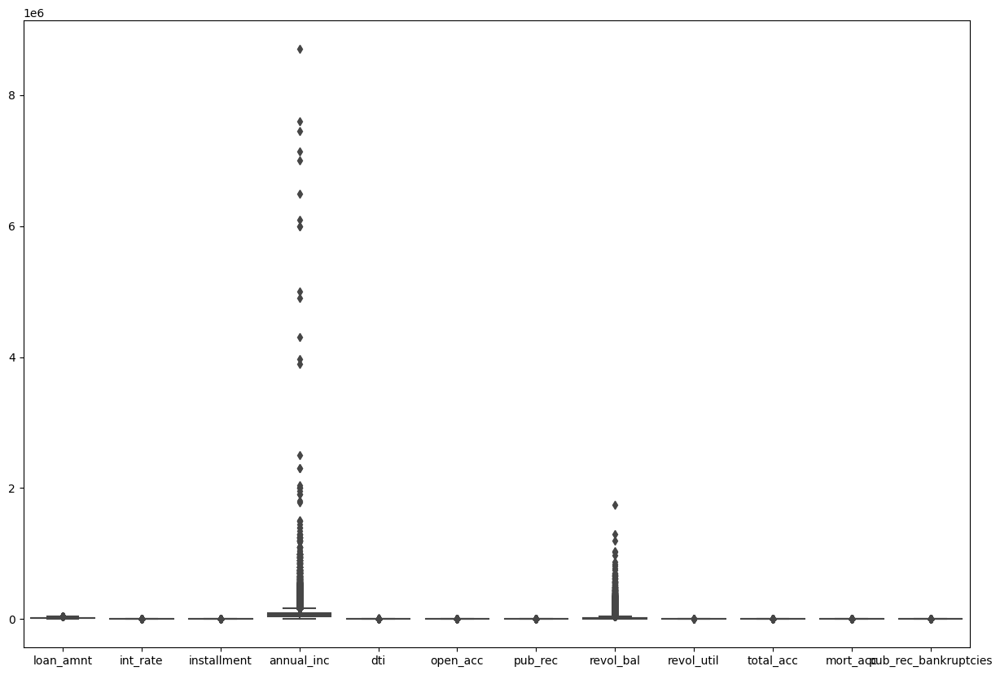

In [21]:
plt.figure(figsize=(15, 10))
sns.boxplot(data=lending)
plt.show()

In [22]:
lending.corr(numeric_only=True)

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
loan_amnt,1.000000,0.168921,0.953929,0.336887,0.016636,0.198556,-0.077779,0.328320,0.099862,0.223886,0.222366,-0.106227
int_rate,0.168921,1.000000,0.162758,-0.056771,0.079038,0.011649,0.060986,-0.011280,0.293548,-0.036404,-0.065296,0.057734
installment,0.953929,0.162758,1.000000,0.330381,0.015786,0.188973,-0.067892,0.316455,0.123851,0.202430,0.198043,-0.098344
annual_inc,0.336887,-0.056771,0.330381,1.000000,-0.081685,0.136150,-0.013720,0.299773,0.027855,0.193023,0.225687,-0.050043
dti,0.016636,0.079038,0.015786,-0.081685,1.000000,0.136181,-0.017639,0.063571,0.088368,0.102128,-0.016946,-0.014384
open_acc,0.198556,0.011649,0.188973,0.136150,0.136181,1.000000,-0.018392,0.221192,-0.131324,0.680728,0.118213,-0.027534
pub_rec,-0.077779,0.060986,-0.067892,-0.013720,-0.017639,-0.018392,1.000000,-0.101664,-0.075904,0.019723,0.020364,0.699380
revol_bal,0.328320,-0.011280,0.316455,0.299773,0.063571,0.221192,-0.101664,1.000000,0.226161,0.191616,0.192332,-0.124405
revol_util,0.099862,0.293548,0.123851,0.027855,0.088368,-0.131324,-0.075904,0.226161,1.000000,-0.104235,0.012840,-0.086399
total_acc,0.223886,-0.036404,0.202430,0.193023,0.102128,0.680728,0.019723,0.191616,-0.104235,1.000000,0.370924,0.042229


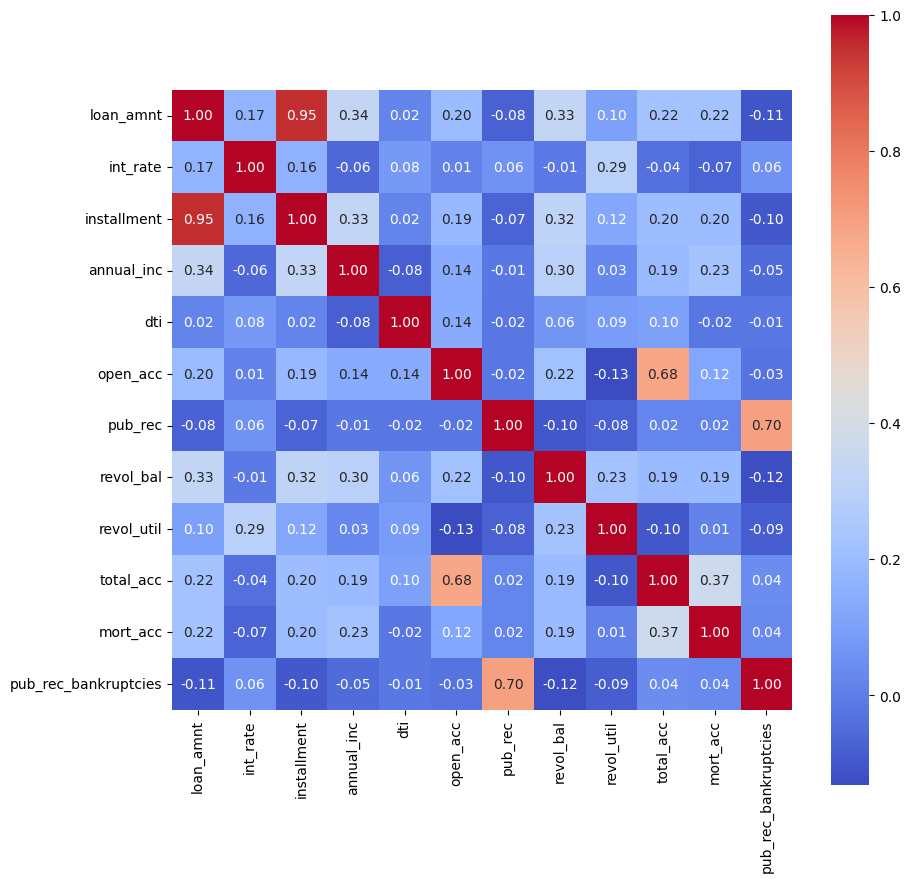

In [23]:
plt.figure(figsize=(10, 10))
sns.heatmap(lending.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.show()

In [24]:
from ydata_profiling import ProfileReport
#from pydantic_settings import BaseSettings
#from pandas_profiling import ProfileReport

In [27]:
report = ProfileReport(lending, title='Lending Club Report')
report


Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.68s/it]


c:\Users\Louis\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


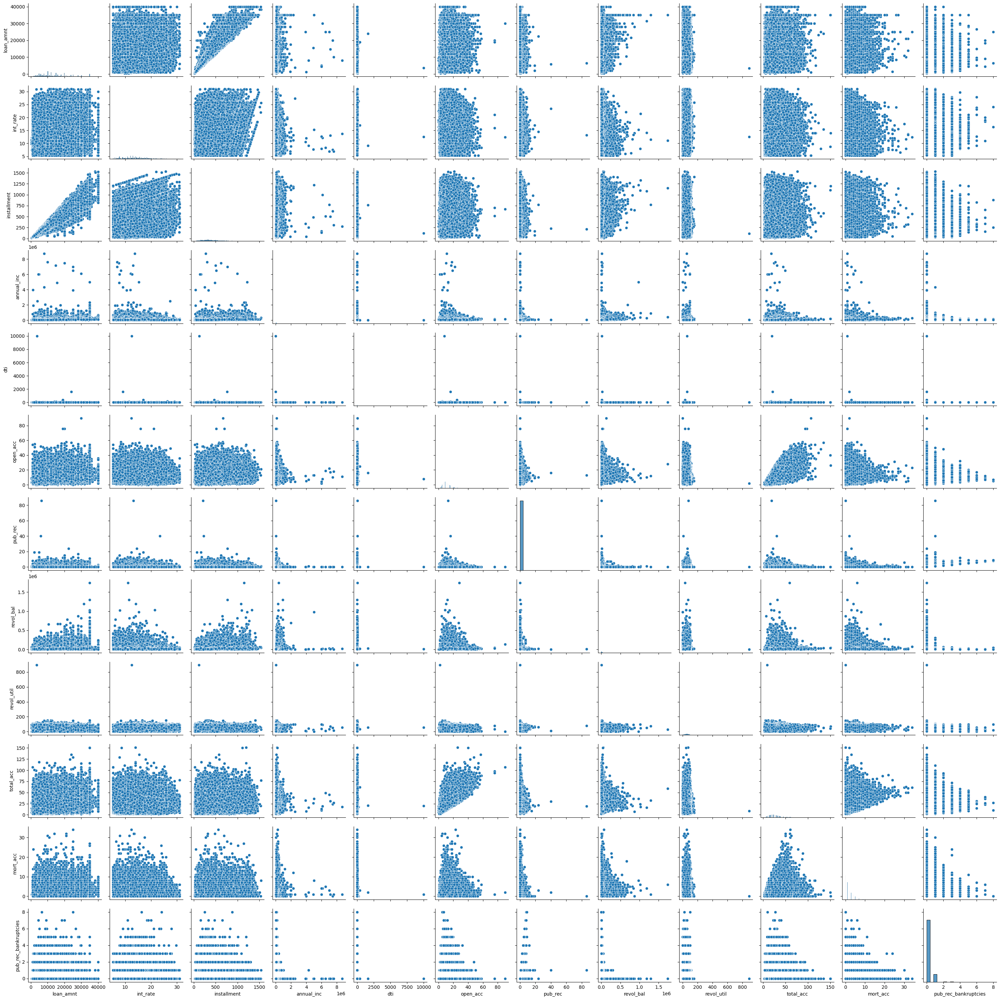

In [28]:
sns.pairplot(lending)

<Axes: xlabel='loan_amnt', ylabel='installment'>

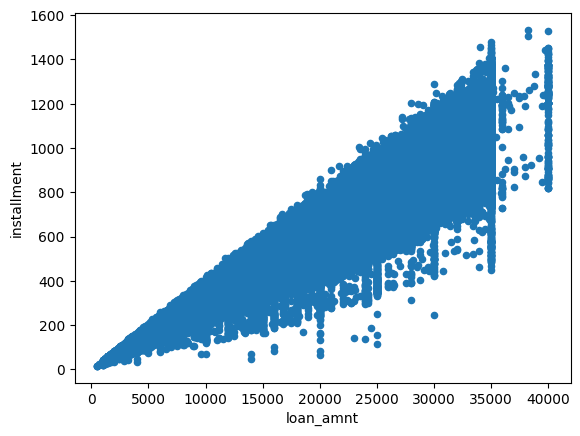

In [29]:
lending.plot.scatter(x="loan_amnt", y="installment")

It shows strong correlation between loan amount and installment.

In [30]:
lending["home_ownership"].value_counts()

home_ownership
MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          112
NONE            31
ANY              3
Name: count, dtype: int64

c:\Users\Louis\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


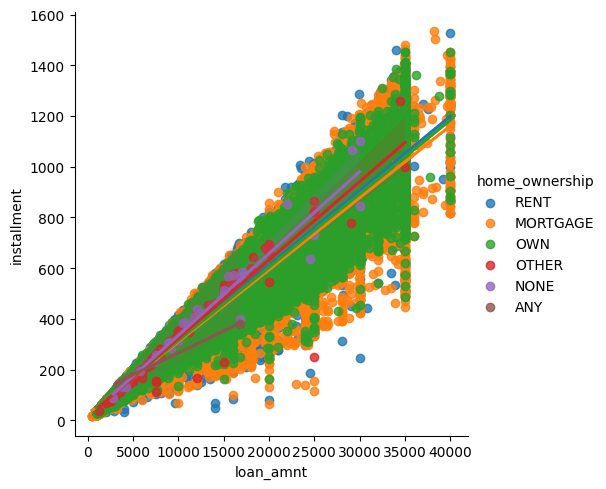

In [31]:
sns.lmplot(x='loan_amnt', y='installment', data=lending, hue='home_ownership', fit_reg=True)

<Axes: xlabel='home_ownership', ylabel='installment'>

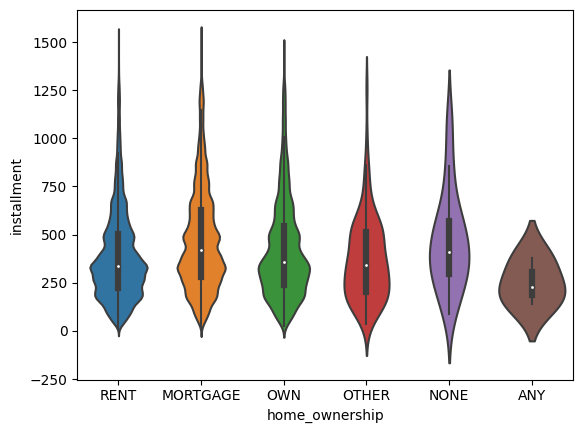

In [33]:
sns.violinplot(x='home_ownership', y='installment', data=lending)